In [1]:
#imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from scipy import stats
import graphviz
from graphviz import Graph

#functions
import wrangle as w
import explore as exp
import model as m


warnings.filterwarnings("ignore")

#evaluate
import sklearn.preprocessing

#feature engineering
from sklearn.cluster import KMeans
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split

# modeling methods
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support

In [2]:
df = w.get_aac()

In [3]:
df = w.clean_aac(df)

In [4]:
# split data

train, validate, test, X_train, y_train, X_validate, y_validate, X_test, y_test = w.split_df(df, "adopted", 3210)

In [5]:
train.shape, validate.shape, test.shape, X_train.shape, y_train.shape, X_validate.shape, y_validate.shape, X_test.shape, y_test.shape

((49249, 16),
 (21108, 16),
 (17590, 16),
 (49249, 15),
 (49249,),
 (21108, 15),
 (21108,),
 (17590, 15),
 (17590,))

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 87947 entries, A663201 to A828158
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           87947 non-null  object
 1   breed          87947 non-null  object
 2   color          87947 non-null  object
 3   dob            87947 non-null  object
 4   outcome_age    87947 non-null  int64 
 5   elderly        87947 non-null  int64 
 6   full_grown     87947 non-null  int64 
 7   youngins       87947 non-null  int64 
 8   neutered_male  87947 non-null  int64 
 9   intact_male    87947 non-null  int64 
 10  neutered       87947 non-null  int64 
 11  is_male        87947 non-null  int64 
 12  is_Dog         87947 non-null  uint8 
 13  is_pitbull     87947 non-null  int64 
 14  is_black       87947 non-null  int64 
 15  adopted        87947 non-null  int64 
dtypes: int64(11), object(4), uint8(1)
memory usage: 10.8+ MB


In [5]:
object_cols = w.get_object_cols(df)

In [18]:
object_cols

['animal_id', 'date', 'breed', 'color', 'dob']

In [7]:
df.head()

,date,breed,color,dob,outcome_age,elderly,full_grown,youngins,neutered_male,intact_male,neutered,is_male,is_Dog,is_pitbull,is_black,adopted
animal_id,,,,,,,,,,,,,,,,
A663201,2013-10-01,Pit Bull Mix,Brown/White,09/14/2011,2,0,1,0,1,0,1,1,1,1,0,0
A661933,2013-10-01,Domestic Shorthair Mix,Blue Tabby,09/19/2003,10,1,0,0,0,0,1,0,0,0,0,0
A660634,2013-10-01,Domestic Shorthair,Blue/White,07/09/2013,0,0,0,1,0,0,1,0,0,0,0,1
A664271,2013-10-01,Domestic Shorthair Mix,Orange Tabby,09/24/2013,0,0,0,1,0,0,0,0,0,0,0,0
A663546,2013-10-01,American Bulldog Mix,White/Brown Brindle,09/20/2011,2,0,1,0,1,0,1,1,1,0,0,0


In [8]:
cat_vars = ['elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'is_male', 
 'neutered',
 'is_pitbull',
 'is_black',
 'is_Dog',
 'breed', 
 'color']

In [13]:
numeric_cols = w.get_numeric_X_cols(train, object_cols)

In [9]:
quant_vars = ['outcome_age']

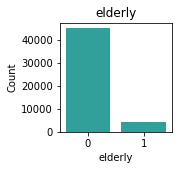

   elderly  Count  Percent
0        0  44900    91.17
1        1   4349     8.83
_________________________________________________________________


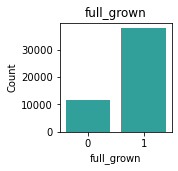

   full_grown  Count  Percent
0           1  37781    76.71
1           0  11468    23.29
_________________________________________________________________


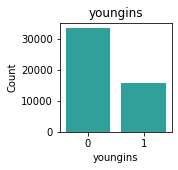

   youngins  Count  Percent
1         0  33432    67.88
0         1  15817    32.12
_________________________________________________________________


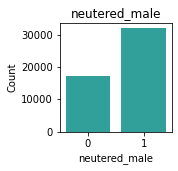

   neutered_male  Count  Percent
0              1  31931    64.84
1              0  17318    35.16
_________________________________________________________________


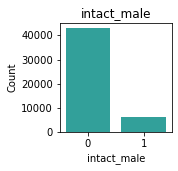

   intact_male  Count  Percent
0            0  42931    87.17
1            1   6318    12.83
_________________________________________________________________


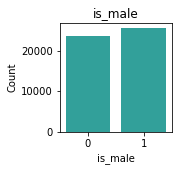

   is_male  Count  Percent
0        1  25613    52.01
1        0  23636    47.99
_________________________________________________________________


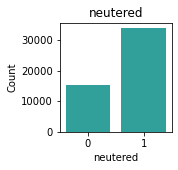

   neutered  Count  Percent
1         1  33825    68.68
0         0  15424    31.32
_________________________________________________________________


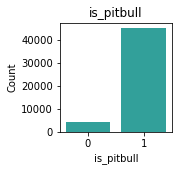

   is_pitbull  Count  Percent
0           1  45141    91.66
1           0   4108     8.34
_________________________________________________________________


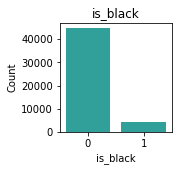

   is_black  Count  Percent
0         0  44763    90.89
1         1   4486     9.11
_________________________________________________________________


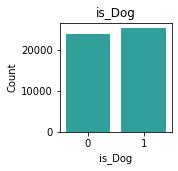

   is_Dog  Count  Percent
1       1  25336    51.44
0       0  23913    48.56
_________________________________________________________________


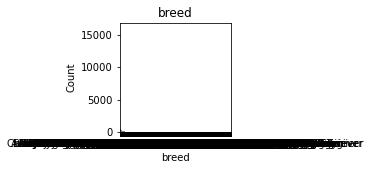

                                                                 breed  Count  \
Domestic Shorthair Mix                                    Pit Bull Mix  16046   
Domestic Shorthair                             Chihuahua Shorthair Mix   3591   
Labrador Retriever Mix                          Domestic Shorthair Mix   2621   
Pit Bull Mix                                     Domestic Longhair Mix   2601   
Chihuahua Shorthair Mix                             Domestic Shorthair   2479   
...                                                                ...    ...   
Rottweiler/Blue Lacy                 Australian Shepherd/Cavalier Span      1   
Cavalier Span/Toy Poodle                     Pbgv/Jack Russell Terrier      1   
Pekingese/Boston Terrier                         Rat Terrier/Pekingese      1   
Samoyed                                     Chinese Sharpei/Rottweiler      1   
Irish Wolfhound/Australian Shepherd                    Harrier/Pointer      1   

                           

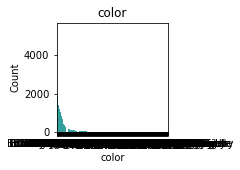

                                       color  Count  Percent
Black/White                      Brown/White   5411    10.99
Black                               Tricolor   4486     9.11
Brown Tabby                Brown Tabby/White   3581     7.27
Brown Tabby/White                  Tan/White   1862     3.78
Orange Tabby                     White/Brown   1733     3.52
...                                      ...    ...      ...
Tricolor/Orange            Black/Brown Merle      1     0.00
Brown Tabby/Agouti        Black/Silver Tabby      1     0.00
Blue Tabby/Tortie   Blue Merle/Brown Brindle      1     0.00
Liver/Chocolate                Apricot/Brown      1     0.00
Brown/Red Tick                   Blue/Silver      1     0.00

[436 rows x 3 columns]
_________________________________________________________________


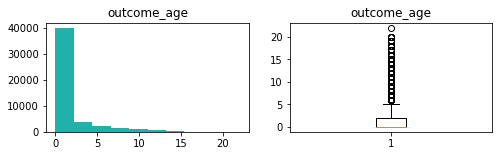

count    49249.000000
mean         1.585636
std          2.701373
min          0.000000
25%          0.000000
50%          0.000000
75%          2.000000
max         22.000000
Name: outcome_age, dtype: float64


In [10]:
exp.explore_univariate(train, cat_vars, quant_vars)

elderly 
_____________________

        chi2       p-value  degrees of freedom
0  55.281945  1.044234e-13                   1

observed:
 adopted      0      1    All
elderly                     
0        20171  24729  44900
1         2210   2139   4349
All      22381  26868  49249

expected:
               0             1
0  20404.615322  24495.384678
1   1976.384678   2372.615322


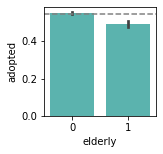


_____________________

full_grown 
_____________________

        chi2       p-value  degrees of freedom
0  39.876084  2.705962e-10                   1

observed:
 adopted         0      1    All
full_grown                     
0           16874  20907  37781
1            5507   5961  11468
All         22381  26868  49249

expected:
               0             1
0  17169.415846  20611.584154
1   5211.584154   6256.415846


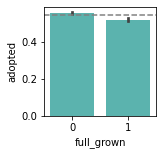


_____________________

youngins 
_____________________

         chi2       p-value  degrees of freedom
0  104.937849  1.260275e-24                   1

observed:
 adopted       0      1    All
youngins                     
0          7717   8100  15817
1         14664  18768  33432
All       22381  26868  49249

expected:
               0             1
0   7187.968832   8629.031168
1  15193.031168  18238.968832


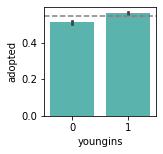


_____________________

neutered_male 
_____________________

          chi2  p-value  degrees of freedom
0  4444.859964      0.0                   1

observed:
 adopted            0      1    All
neutered_male                     
0              18029  13902  31931
1               4352  12966  17318
All            22381  26868  49249

expected:
               0             1
0  14510.908059  17420.091941
1   7870.091941   9447.908059


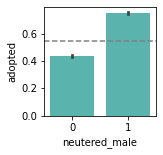


_____________________

intact_male 
_____________________

          chi2  p-value  degrees of freedom
0  6531.260955      0.0                   1

observed:
 adopted          0      1    All
intact_male                     
0            16523  26408  42931
1             5858    460   6318
All          22381  26868  49249

expected:
              0            1
0  19509.81159  23421.18841
1   2871.18841   3446.81159


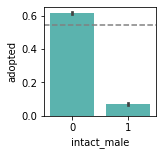


_____________________

is_male 
_____________________

       chi2       p-value  degrees of freedom
0  92.44271  6.930222e-22                   1

observed:
 adopted      0      1    All
is_male                     
0        12171  13442  25613
1        10210  13426  23636
All      22381  26868  49249

expected:
               0             1
0  11639.719649  13973.280351
1  10741.280351  12894.719649


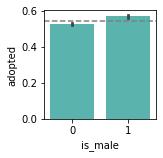


_____________________

neutered 
_____________________

           chi2  p-value  degrees of freedom
0  21020.122075      0.0                   1

observed:
 adopted       0      1    All
neutered                     
0         14440    984  15424
1          7941  25884  33825
All       22381  26868  49249

expected:
               0             1
0   7009.371642   8414.628358
1  15371.628358  18453.371642


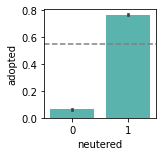


_____________________

is_pitbull 
_____________________

       chi2   p-value  degrees of freedom
0  9.138485  0.002503                   1

observed:
 adopted         0      1    All
is_pitbull                     
0           20607  24534  45141
1            1774   2334   4108
All         22381  26868  49249

expected:
               0             1
0  20514.136754  24626.863246
1   1866.863246   2241.136754


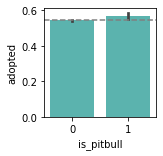


_____________________

is_black 
_____________________

        chi2       p-value  degrees of freedom
0  69.918599  6.180294e-17                   1

observed:
 adopted       0      1    All
is_black                     
0         20076  24687  44763
1          2305   2181   4486
All       22381  26868  49249

expected:
               0             1
0  20342.356251  24420.643749
1   2038.643749   2447.356251


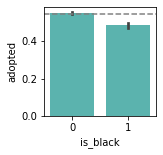


_____________________

is_Dog 
_____________________

          chi2        p-value  degrees of freedom
0  1042.732041  9.248099e-229                   1

observed:
 adopted      0      1    All
is_Dog                      
0        12651  11262  23913
1         9730  15606  25336
All      22381  26868  49249

expected:
               0             1
0  10867.161831  13045.838169
1  11513.838169  13822.161831


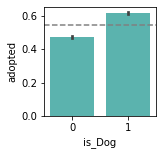


_____________________

breed 
_____________________

          chi2        p-value  degrees of freedom
0  3595.771513  6.066603e-148                1639

observed:
 adopted                                            0      1    All
breed                                                             
Abyssinian                                         2      3      5
Abyssinian Mix                                     2      3      5
Affenpinscher                                      0      1      1
Affenpinscher Mix                                  0      3      3
Airedale Terrier                                   0      1      1
...                                              ...    ...    ...
Yorkshire Terrier/Rat Terrier                      2      3      5
Yorkshire Terrier/Soft Coated Wheaten Terrier      0      1      1
Yorkshire Terrier/Standard Poodle                  0      1      1
Yorkshire Terrier/Toy Poodle                       1      3      4
All                           

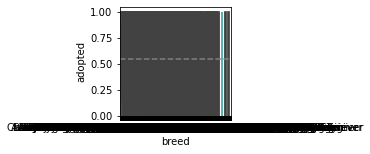


_____________________

color 
_____________________

          chi2        p-value  degrees of freedom
0  1457.615029  1.669007e-110                 435

observed:
 adopted                  0      1    All
color                                   
Agouti                   2      5      7
Agouti/White             1      0      1
Apricot                 10     13     23
Apricot/Brown            1      0      1
Apricot/White            1      2      3
...                    ...    ...    ...
Yellow/Orange            2      1      3
Yellow/Orange Tabby      1      0      1
Yellow/Tan               3      0      3
Yellow/White            16     34     50
All                  22381  26868  49249

[437 rows x 3 columns]

expected:
              0          1
0     3.181120   3.818880
1     0.454446   0.545554
2    10.452253  12.547747
3     0.454446   0.545554
4     1.363337   1.636663
..         ...        ...
431   0.454446   0.545554
432   1.363337   1.636663
433   0.454446   0.545554
434  

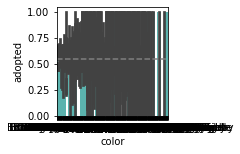


_____________________

outcome_age 
____________________



KeyboardInterrupt: 

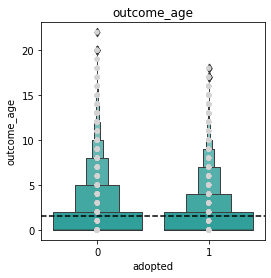

In [11]:
target = 'adopted'

exp.explore_bivariate(train, target, cat_vars, quant_vars)

In [16]:
cols = ['outcome_age', 'elderly', 'full_grown', 'youngins', 'neutered_male', 'intact_male', 'neutered', 'is_pitbull', 'is_black', 'is_Dog']

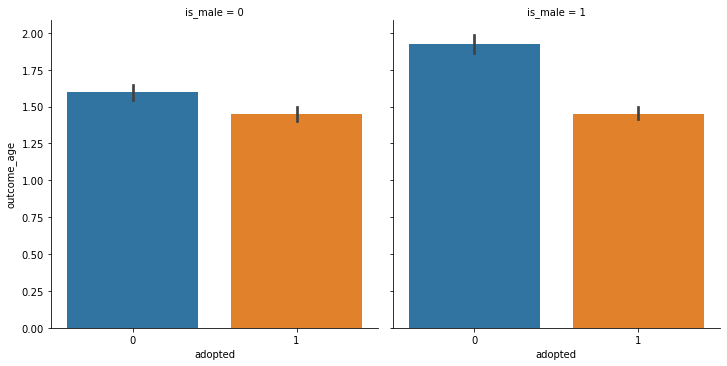

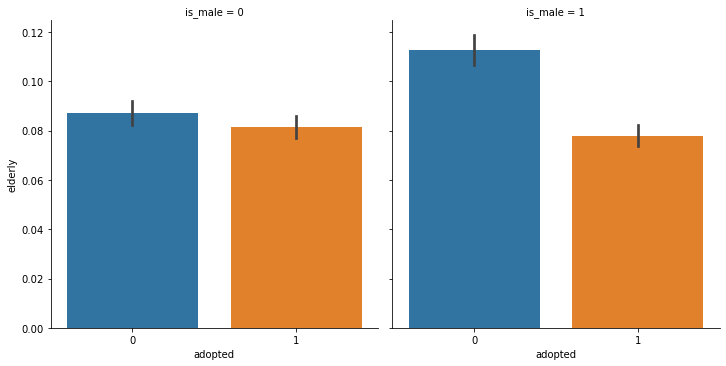

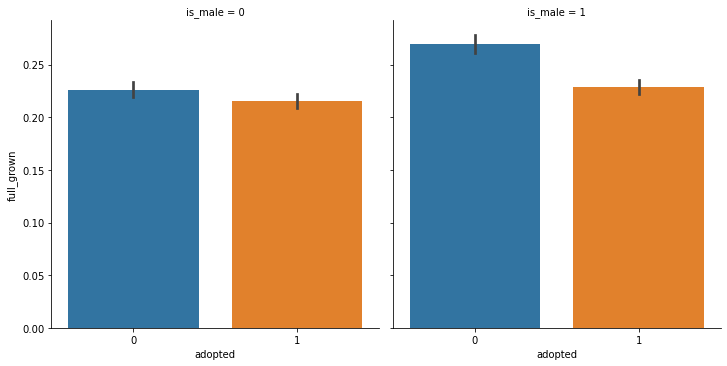

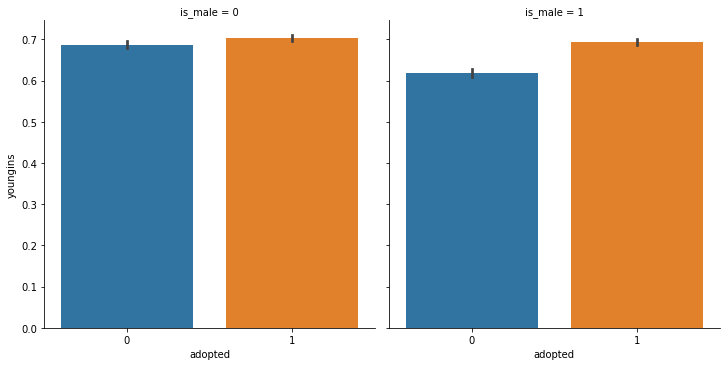

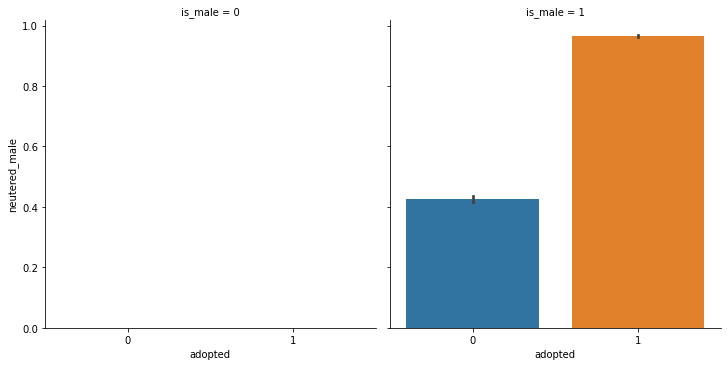

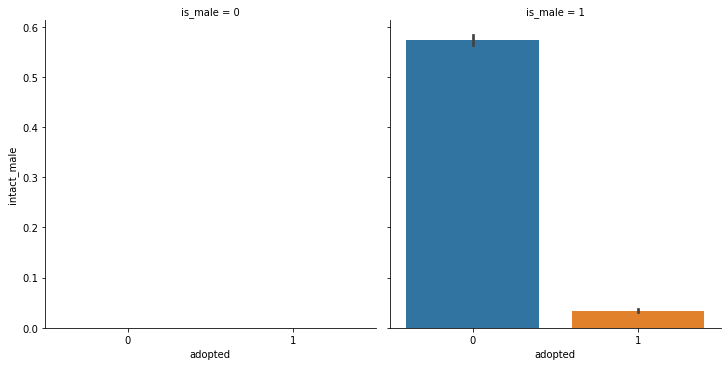

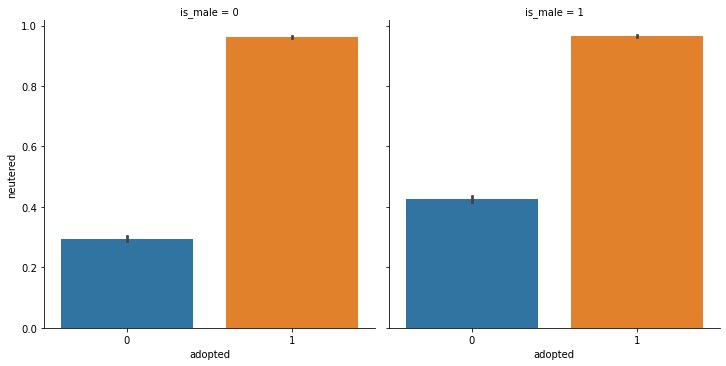

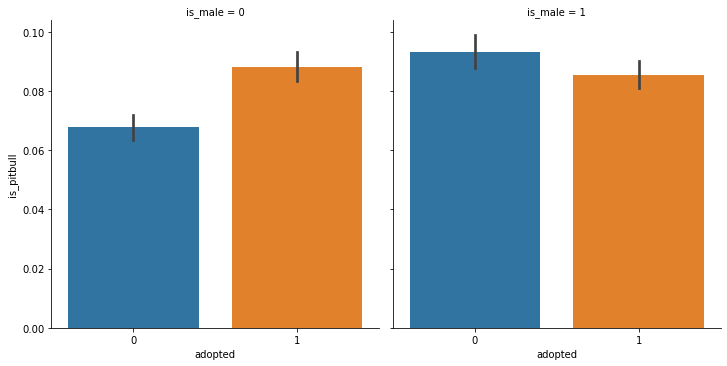

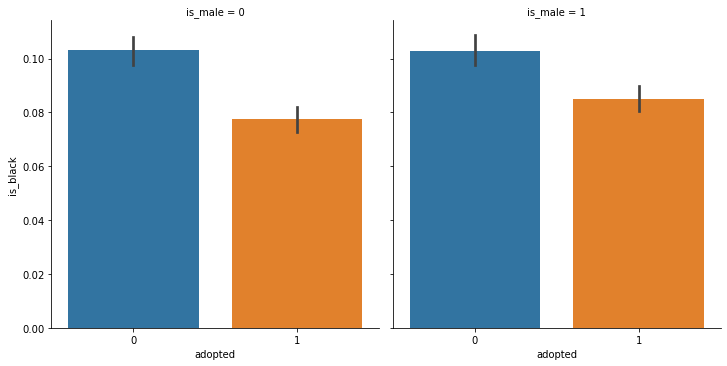

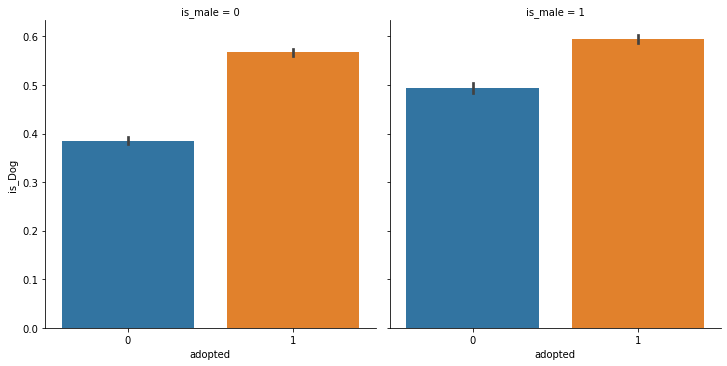

In [17]:
for col in cols:
    g = sns.catplot(x="adopted", y=col, kind="bar", col="is_male", data=train)


In [18]:
cols = ['elderly', 'full_grown', 'youngins', 'neutered_male', 'intact_male', 'neutered', 'is_black', 'is_Dog']

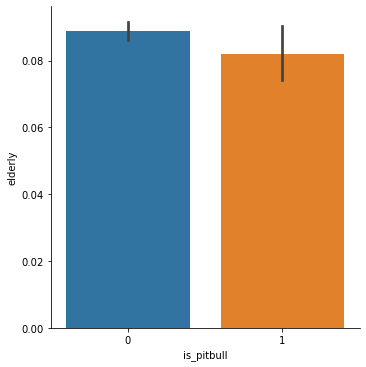

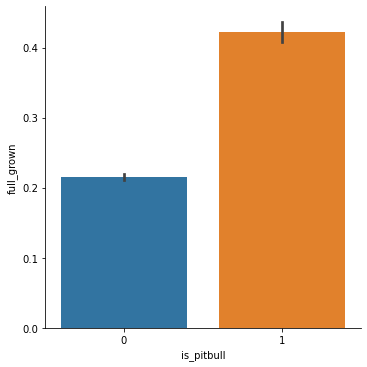

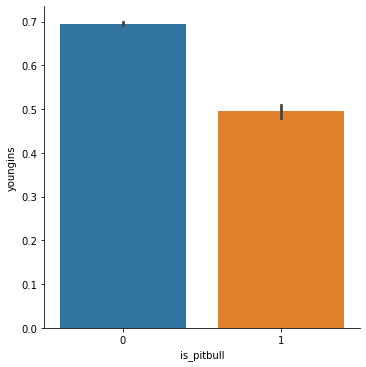

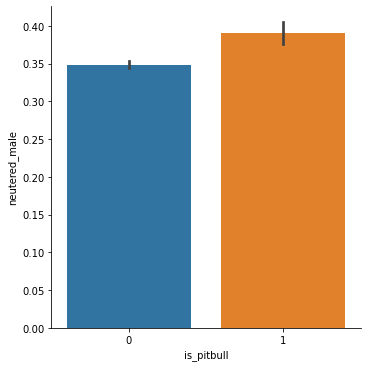

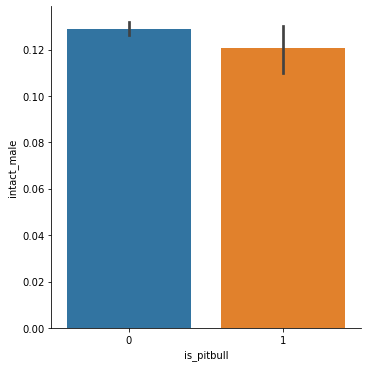

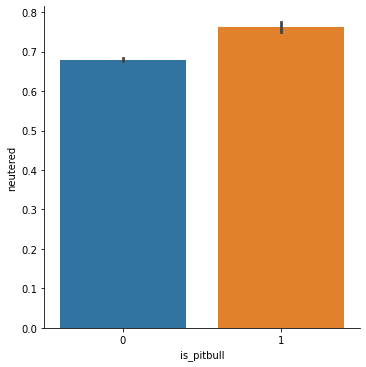

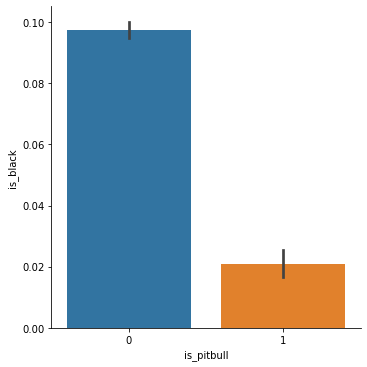

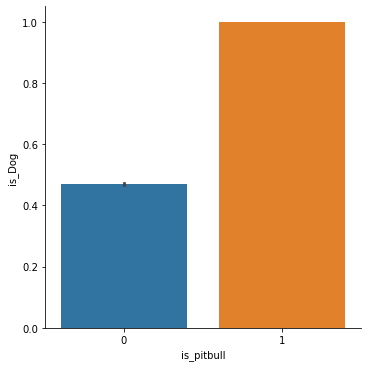

In [19]:
for col in cols:
    g = sns.catplot(x='is_pitbull', y=col, kind="bar", data=train)

<AxesSubplot:xlabel='count', ylabel='color'>

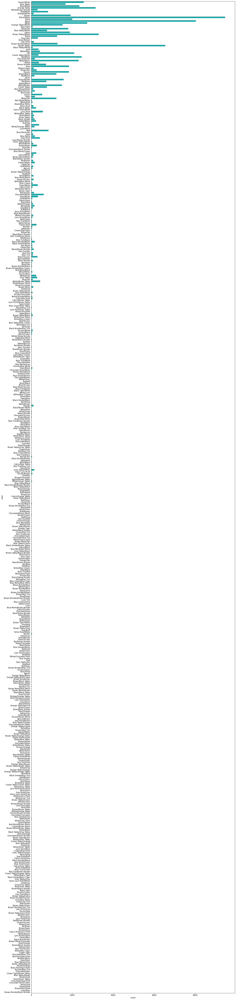

In [89]:
f, ax = plt.subplots(figsize=(20, 100))
sns.countplot(y="color", data=df, color="c")

<AxesSubplot:xlabel='count', ylabel='color'>

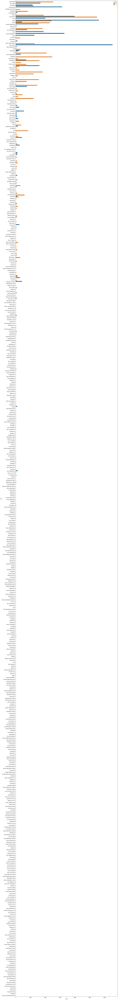

In [52]:
f, ax = plt.subplots(figsize=(20, 200))
sns.countplot(y="color", data=df, hue="is_Dog")

<AxesSubplot:xlabel='count', ylabel='breed'>

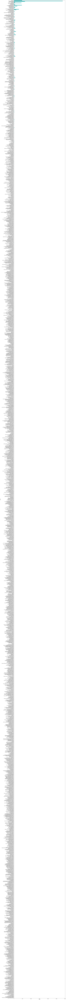

In [48]:
f, ax = plt.subplots(figsize=(20, 400))
sns.countplot(y="breed", data=df, color="c")

<AxesSubplot:xlabel='count', ylabel='breed'>

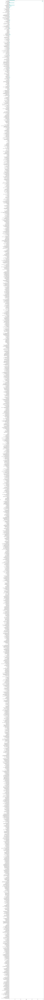

In [50]:
f, ax = plt.subplots(figsize=(20, 600))
sns.countplot(y="breed", data=df, hue="is_Dog", color="c")

Text(0.5, 1.0, 'Adopted Status vs. Age')

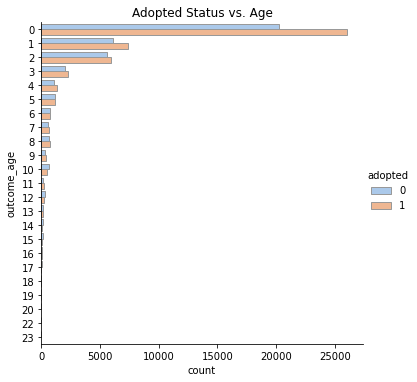

In [54]:
sns.catplot(y="outcome_age", hue="adopted", kind="count",
            palette="pastel", edgecolor=".6",
            data=df)
plt.title("Adopted Status vs. Age")

In [61]:
f, ax = plt.subplots(figsize=(800, 200))
sns.countplot(x="date", data=df, hue="adopted")

<AxesSubplot:xlabel='date', ylabel='count'>

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87947 entries, 20494 to 124490
Data columns (total 17 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   animal_id      87947 non-null  object
 1   date           87947 non-null  object
 2   breed          87947 non-null  object
 3   color          87947 non-null  object
 4   dob            87947 non-null  object
 5   outcome_age    87947 non-null  int64 
 6   elderly        87947 non-null  int64 
 7   full_grown     87947 non-null  int64 
 8   youngins       87947 non-null  int64 
 9   neutered_male  87947 non-null  int64 
 10  intact_male    87947 non-null  int64 
 11  neutered       87947 non-null  int64 
 12  is_male        87947 non-null  int64 
 13  is_Dog         87947 non-null  uint8 
 14  is_pitbull     87947 non-null  int64 
 15  is_black       87947 non-null  int64 
 16  adopted        87947 non-null  int64 
dtypes: int64(11), object(5), uint8(1)
memory usage: 11.5+ MB


In [ ]:
df[df.what_youre_checking == 1].target.value_counts()

In [38]:
df

,animal_id,date,breed,color,dob,outcome_age,elderly,full_grown,youngins,neutered_male,intact_male,neutered,is_male,is_Dog,is_pitbull,is_black,adopted
20494,A663201,2013-10-01,Pit Bull Mix,Brown/White,09/14/2011,2,0,1,0,1,0,1,1,1,1,0,0
40279,A661933,2013-10-01,Domestic Shorthair Mix,Blue Tabby,09/19/2003,10,1,0,0,0,0,1,0,0,0,0,0
85540,A660634,2013-10-01,Domestic Shorthair,Blue/White,07/09/2013,0,0,0,1,0,0,1,0,0,0,0,1
42193,A664271,2013-10-01,Domestic Shorthair Mix,Orange Tabby,09/24/2013,0,0,0,1,0,0,0,0,0,0,0,0
38947,A663546,2013-10-01,American Bulldog Mix,White/Brown Brindle,09/20/2011,2,0,1,0,1,0,1,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
124472,A829552,2021-03-03,German Shepherd,Tan/Black,02/13/2020,1,0,0,1,0,0,1,0,1,0,0,1
124470,A822366,2021-03-03,Domestic Shorthair,Black/White,11/24/2017,3,0,1,0,0,0,1,0,0,0,0,1
124469,A829483,2021-03-03,Labrador Retriever/German Shepherd,Tan/White,02/11/2020,1,0,0,1,1,0,1,1,1,0,0,1
124481,A829868,2021-03-03,Beagle/Labrador Retriever,Tricolor,02/25/2020,1,0,0,1,1,0,1,1,1,0,0,1


# Hypotheses Testing

hypothesis1: age affects adoption

In [22]:
null_hypothesis = "Age and adoption rates are INDEPENDENT."
alternative_hypothesis = "There is a relationship between pet age and if they get adopted."
confidence_level = .99
a = 1 - confidence_level 

In [28]:
observed1 = pd.crosstab(train.youngins, train.adopted)
observed1

adopted,0,1
youngins,,
0,7717,8100
1,14664,18768


In [29]:
chi2, p, degf, expected = stats.chi2_contingency(observed1)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Age and adoption rates are INDEPENDENT.
Therefore: There is a relationship between pet age and if they get adopted.


1.2602750128161975e-24

In [30]:
observed2 = pd.crosstab(train.elderly, train.adopted)
observed2

adopted,0,1
elderly,,
0,20171,24729
1,2210,2139


In [31]:
chi2, p, degf, expected = stats.chi2_contingency(observed2)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Age and adoption rates are INDEPENDENT.
Therefore: There is a relationship between pet age and if they get adopted.


1.0442337038715821e-13

In [32]:
observed3 = pd.crosstab(train.full_grown, train.adopted)
observed3

adopted,0,1
full_grown,,
0,16874,20907
1,5507,5961


In [34]:
chi2, p, degf, expected = stats.chi2_contingency(observed3)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Age and adoption rates are INDEPENDENT.
Therefore: There is a relationship between pet age and if they get adopted.


2.705962287519456e-10

hypothesis2: There is a relationship between breed and adoption.

In [39]:
null_hypothesis = "Breed and adoption rates are INDEPENDENT."
alternative_hypothesis = "There is a relationship between breed and if they get adopted."
confidence_level = .99
a = 1 - confidence_level 

In [40]:
observed5 = pd.crosstab(train.is_pitbull, train.adopted)
observed5

adopted,0,1
is_pitbull,,
0,20607,24534
1,1774,2334


In [41]:
chi2, p, degf, expected = stats.chi2_contingency(observed5)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Breed and adoption rates are INDEPENDENT.
Therefore: There is a relationship between breed and if they get adopted.


0.0025028831091415214

hypothesis3: Dogs are adopted more than cats.

In [35]:
null_hypothesis = "Species and adoption rates are INDEPENDENT."
alternative_hypothesis = "There is a relationship between species and if they get adopted."
confidence_level = .99
a = 1 - confidence_level 

In [36]:
observed4 = pd.crosstab(train.youngins, train.adopted)
observed4

adopted,0,1
youngins,,
0,7717,8100
1,14664,18768


In [37]:
chi2, p, degf, expected = stats.chi2_contingency(observed4)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Species and adoption rates are INDEPENDENT.
Therefore: There is a relationship between species and if they get adopted.


1.2602750128161975e-24

hypothesis4: There is a relationship between color and adoption.

In [42]:
null_hypothesis = "Black coats and adoption rates are INDEPENDENT."
alternative_hypothesis = "There is a relationship between black coats and if they get adopted."
confidence_level = .99
a = 1 - confidence_level 

In [43]:
observed6 = pd.crosstab(train.is_black, train.adopted)
observed6

adopted,0,1
is_black,,
0,20076,24687
1,2305,2181


In [44]:
chi2, p, degf, expected = stats.chi2_contingency(observed6)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Black coats and adoption rates are INDEPENDENT.
Therefore: There is a relationship between black coats and if they get adopted.


6.180294118584827e-17

# Feature Importance

In [9]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 49249 entries, A681369 to A713135
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   date           49249 non-null  object
 1   breed          49249 non-null  object
 2   color          49249 non-null  object
 3   dob            49249 non-null  object
 4   outcome_age    49249 non-null  int64 
 5   elderly        49249 non-null  int64 
 6   full_grown     49249 non-null  int64 
 7   youngins       49249 non-null  int64 
 8   neutered_male  49249 non-null  int64 
 9   intact_male    49249 non-null  int64 
 10  neutered       49249 non-null  int64 
 11  is_male        49249 non-null  int64 
 12  is_Dog         49249 non-null  uint8 
 13  is_pitbull     49249 non-null  int64 
 14  is_black       49249 non-null  int64 
dtypes: int64(10), object(4), uint8(1)
memory usage: 5.7+ MB


In [7]:
X_train.iloc[:, 4:]

,outcome_age,elderly,full_grown,youngins,neutered_male,intact_male,neutered,is_male,is_Dog,is_pitbull,is_black
animal_id,,,,,,,,,,,
A681369,2,0,1,0,1,0,1,1,1,1,0
A745017,2,0,1,0,1,0,1,1,1,0,0
A734684,2,0,1,0,1,0,1,1,0,0,0
A694088,2,0,1,0,1,0,1,1,1,1,0
A732064,7,1,0,0,0,1,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...
A800464,0,0,0,1,0,0,1,0,0,0,1
A754472,0,0,0,1,0,0,1,0,1,0,0
A679911,0,0,0,1,1,0,1,1,0,0,0


In [7]:
X_train_lim = X_train.iloc[:, 4:]

In [8]:
X_train_lim.shape

(49249, 11)

In [16]:
f_feature = exp.select_kbest(X_train_lim, y_train, 3)
f_feature

['neutered_male', 'intact_male', 'neutered']

In [18]:
rfe_feature = exp.rfe(X_train_lim, y_train, 3)
rfe_feature 

['elderly', 'youngins', 'neutered']

In [22]:
f_feature = exp.select_kbest(X_train_lim, y_train, 8)
f_feature

['outcome_age',
 'elderly',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_black']

In [23]:
rfe_feature = exp.rfe(X_train_lim, y_train, 8)
rfe_feature 

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_Dog']

In [24]:
f_feature = exp.select_kbest(X_train_lim, y_train, 11)
f_feature

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black']

In [25]:
rfe_feature = exp.rfe(X_train_lim, y_train, 11)
rfe_feature 

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black']

In [49]:
df.color.value_counts()

Black/White                9465
Black                      8039
Brown Tabby                6538
Brown Tabby/White          3287
Orange Tabby               3137
                           ... 
Silver Lynx Point/White       1
Tricolor/Gray                 1
Yellow Brindle/Blue           1
Tortie/Gray                   1
Black Tabby/Black             1
Name: color, Length: 526, dtype: int64

# Modeling

In [10]:
# establish baseline
df.adopted.value_counts()

1    47878
0    40069
Name: adopted, dtype: int64

In [9]:
train['baseline_prediction'] = 1

# DecisionTreeClassifier

In [10]:
# Let's generate a blank, new Decision Tree model
# Be sure to set the max_depth argument
# clf = DecisionTreeClassifier(max_depth=3, random_state=123)

clf = DecisionTreeClassifier(max_depth=3, random_state=3210)

In [11]:
# Now let's train our model on the training data
# fitting == training the model
clf = clf.fit(X_train_lim, y_train)
clf

DecisionTreeClassifier(max_depth=3, random_state=3210)

In [12]:
# To programmatically specify the output class labels
# Visualize the model so it can explain itself!
# dataframe.target_variable.unique() then sort the array

dot_data = export_graphviz(clf, feature_names= X_train_lim.columns, rounded=True, filled=True, out_file=None)
graph = graphviz.Source(dot_data) 

graph.render('aac_decision_tree', view=True, format="pdf")

'aac_decision_tree.pdf'

In [13]:
# Now we'll make a SET OF PREDICTIONS using this trained model
y_pred = clf.predict(X_train_lim)
# ESTIMATE THE PROBABLITIES for each class
y_pred_proba = clf.predict_proba(X_train_lim)

In [14]:
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.65      0.76     22381
           1       0.77      0.96      0.85     26868

    accuracy                           0.82     49249
   macro avg       0.85      0.80      0.81     49249
weighted avg       0.84      0.82      0.81     49249



In [17]:
def get_metrics(mod, X, y):
    baseline_accuracy = (train.adopted == 1).mean()
    y_pred = mod.predict(X)
    accuracy = mod.score(X, y)
    conf = confusion_matrix(y, y_pred)
    prfs = pd.DataFrame(precision_recall_fscore_support(y, y_pred), index=['precision', 'recall', 'f1-score', 'support'])
    
    print(f'''
    BASELINE accuracy is: {baseline_accuracy:.2%}
    The accuracy for our model is: {accuracy:.2%} 
    ''')
    return prfs

In [18]:
get_metrics(clf, X_train_lim, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.88% 
    


,0,1
precision,0.936203,0.765233
recall,0.645190,0.963377
f1-score,0.763920,0.852948
support,22381.000000,26868.000000


# RandomForestClassifier

In [19]:
#create the Random Forest object
rf = RandomForestClassifier(max_depth=3, random_state=3210)

In [20]:
rf = rf.fit(X_train_lim, y_train)
rf

RandomForestClassifier(max_depth=3, random_state=3210)

In [21]:
# visualize the importance weight
feature_importances = pd.DataFrame(rf.feature_importances_,
                                  index = X_train_lim.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)
feature_importances

,importance
neutered,0.562764
intact_male,0.192568
neutered_male,0.107193
is_male,0.041605
is_Dog,0.033446
outcome_age,0.032843
youngins,0.017593
elderly,0.004780
full_grown,0.004022
is_black,0.002561


In [22]:
#make predictions
y_pred = rf.predict(X_train_lim)
# estimate probability:
y_pred_proba = rf.predict_proba(X_train_lim)

In [23]:
get_metrics(rf, X_train_lim, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.88% 
    


,0,1
precision,0.936203,0.765233
recall,0.645190,0.963377
f1-score,0.763920,0.852948
support,22381.000000,26868.000000


# KNN

In [24]:
# Create KNN object
# weights = ['uniform', 'density']
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')

In [25]:
# fit the model
knn.fit(X_train_lim, y_train)

KNeighborsClassifier()

In [26]:
get_metrics(knn, X_train_lim, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.32% 
    


,0,1
precision,0.859787,0.785543
recall,0.703588,0.904422
f1-score,0.773884,0.840801
support,22381.000000,26868.000000


# LogisticRegression

In [27]:
# create the object
# Define the logistic regression model
logit = LogisticRegression(C=1, random_state=3210)

In [28]:
# fit the model on train data
logit.fit(X_train_lim, y_train)

LogisticRegression(C=1, random_state=3210)

In [29]:
get_metrics(logit, X_train_lim, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.05% 
    


,0,1
precision,0.915761,0.773497
recall,0.666413,0.948936
f1-score,0.771439,0.852281
support,22381.000000,26868.000000


In [30]:
# remove object types from splits

X_validate_lim = X_validate.iloc[:, 4:]
X_test_lim = X_test.iloc[:, 4:]

# Run models on Validate


In [31]:
get_metrics(clf, X_validate_lim, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.24% 
    


,0,1
precision,0.939191,0.767835
recall,0.654205,0.964286
f1-score,0.771212,0.854920
support,9656.000000,11452.000000


In [32]:
get_metrics(rf, X_validate_lim, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.24% 
    


,0,1
precision,0.939191,0.767835
recall,0.654205,0.964286
f1-score,0.771212,0.854920
support,9656.000000,11452.000000


In [33]:
get_metrics(knn, X_validate_lim, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.52% 
    


,0,1
precision,0.860363,0.787701
recall,0.711475,0.902637
f1-score,0.778867,0.841261
support,9656.000000,11452.000000


In [34]:
get_metrics(logit, X_validate_lim, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.40% 
    


,0,1
precision,0.918204,0.776223
recall,0.675435,0.949267
f1-score,0.778328,0.854068
support,9656.000000,11452.000000


# Run best model on out of sample Test

In [35]:
get_metrics(logit, X_test_lim, y_test)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.88% 
    


,0,1
precision,0.910941,0.772381
recall,0.668576,0.945072
f1-score,0.771164,0.850045
support,8032.000000,9558.000000


Final model out performs Baseline Accuracy by a 27% increase!

In [38]:
accuracies_df = pd.DataFrame({
    'Actual Adoption': [round(((df.adopted == 1).mean())*100, 2)], 
    'Baseline Adoption Accuracy': [round(((train.adopted == 1).mean())*100, 2)], 
    'Logit Model Adoption Accuracy': [round((logit.score(X_test_lim, y_test))*100, 2)]
})

In [43]:
accdf = accuracies_df.T

In [49]:
accdf = accdf.rename(columns={accdf.columns[0]: 'accuracies'})

In [50]:
accdf

,accuracies
Actual Adoption,54.44
Baseline Adoption Accuracy,54.56
Logit Model Adoption Accuracy,81.88


Text(0.5, 1.0, 'First Iteration Model Comparison')

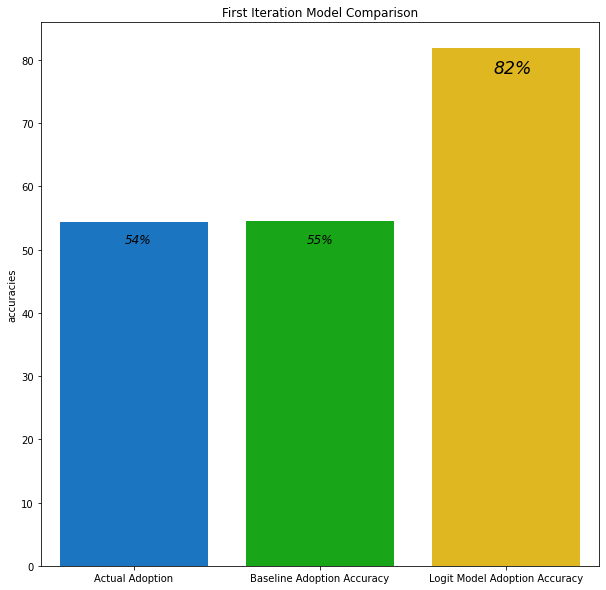

In [88]:

f, ax = plt.subplots(figsize=(10, 10)) 
sns.barplot(x=accdf.index, y="accuracies", data = accdf, palette='nipy_spectral')

ax.text(1.93, 78, '82%', style='italic', size='xx-large')
ax.text(0.93, 51, '55%', style='italic', size='large')
ax.text(-0.05, 51, '54%', style='italic', size='large')

plt.title("First Iteration Model Comparison")
